In this notebook we will look at different ways to realize a regression in order to determine the price given by the Black & Scholes model. In further study we could look at a same regression problem but with the use of Heston model in order to generate our training and test set.

We will review many methods to get a basis and then confronting the result produced by the paper : 

**Pricing options and computing implied volatilities
using neural networks**, *Shuaiqiang Liu, Cornelis W. Oosterlee, and Sander M.Bohte*, 2019.

In this paper the authors make the assomption that a neural network will give good result and does't act with a good methodology. Using a neural network is computing expensive and requires to twick many parameters. There exist many other methods that are far easier to use, far more explainable and far quicker to developp. 

Just by looking at the result produced by the neural network, saying that a polynomial regression will produce good result isn't stupid.

And even if the result aren't as good as expected there are other key method to try.

In [0]:
import sys
import os
import numpy as np

In [0]:
from sklearn import neighbors
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt
import matplotlib.pyplot as plt
%matplotlib inline

In [23]:
!git clone https://github.com/NicolasMakaroff/PES-metamodeling.git
%cd PES-metamodeling/src/
sys.path.append(os.getcwd())
%cd ../..

fatal: destination path 'PES-metamodeling' already exists and is not an empty directory.
/content/PES-metamodeling/src
/content


In [0]:
from data_gestion import open_data, norm, create_train_test_set 

In [0]:
database = open_data('/content/drive/My Drive/Colab Notebooks/PRR/implicite-volatility.csv')   

In [0]:
train_features, train_labels, test_features, test_labels = create_train_test_set(database,0.08,1.,'price')  
normed_train_features, normed_test_features = norm(train_features), norm(test_features)

# Parametric methods

To get a basis result to compare the improvent, let's start with a linear regression.

In [0]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error

reg_linear = linear_model.LinearRegression()
reg_linear.fit(normed_train_features,train_labels)
y1 = reg_linear.predict(normed_test_features)
mse = mean_squared_error(y1,test_labels)
mae = mean_absolute_error(y1,test_labels)

print('log(MSE) : %.f' %np.log(mse))
print('log(MAE) : %.f' %np.log(mae))

log(MSE) : -6
log(MAE) : -3


RMSE : -5.65686783430457 and degree : 1
RMSE : -7.479524253964072 and degree : 2
RMSE : -9.282413785478573 and degree : 3
RMSE : -9.784881908869398 and degree : 4
RMSE : -10.46997710388266 and degree : 5
RMSE : -11.224386073370106 and degree : 6
RMSE : -11.693764907748898 and degree : 7


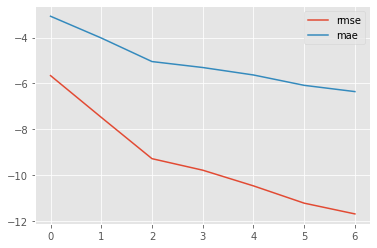

In [0]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model
from matplotlib import pyplot as plt
import numpy as np
plt.style.use("ggplot")
mse_tab = []
mae_tab = []
for i in range(1,8):
  polyn = PolynomialFeatures(degree=i)
  x_ = polyn.fit_transform(normed_train_features) #x_ contient les degrés et produits croisés
  #Une fois qu'on a préparé les degrés on peut faire la régression
  clf = linear_model.Ridge()
  clf.fit(x_,train_labels)
  y_ = polyn.fit_transform(normed_test_features)
  y1 = clf.predict(y_)
  mse = mean_squared_error(y1,test_labels)
  mae = mean_absolute_error(y1,test_labels)
  mse_tab.append(np.log(mse))
  mae_tab.append(np.log(mae))
  print('RMSE : {} and degree : {}' .format(np.log(mse),i))
plt.plot(mse_tab,label='rmse')
plt.plot(mae_tab,label='mae')
plt.legend()
plt.show()

RMSE : -13.182737792640749 and degree : 11
RMSE : -13.44671505966306 and degree : 12
RMSE : -13.674897946461913 and degree : 13
RMSE : -13.869816998240749 and degree : 14


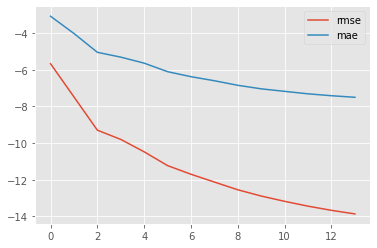

In [0]:
for i in range(11,15):
  polyn = PolynomialFeatures(degree=i)
  x_ = polyn.fit_transform(normed_train_features) #x_ contient les degrés et produits croisés
  #Une fois qu'on a préparé les degrés on peut faire la régression
  clf = linear_model.LinearRegression()
  clf.fit(x_,train_labels)
  y_ = polyn.fit_transform(normed_test_features)
  y1 = clf.predict(y_)
  mse = mean_squared_error(y1,test_labels)
  mae = mean_absolute_error(y1,test_labels)
  mse_tab.append(np.log(mse))
  mae_tab.append(np.log(mae))
  print('RMSE : {} and degree : {}' .format(np.log(mse),i))
plt.plot(mse_tab,label='rmse')
plt.plot(mae_tab,label='mae')
plt.legend()
plt.show()

In [0]:
polyn = PolynomialFeatures(degree=15)
x_ = polyn.fit_transform(normed_train_features) #x_ contient les degrés et produits croisés
#Une fois qu'on a préparé les degrés on peut faire la régression
clf = linear_model.LinearRegression()
clf.fit(x_,train_labels)
y_ = polyn.fit_transform(normed_test_features)
y1 = clf.predict(y_)
mse = mean_squared_error(y1,test_labels)
#mae = mean_absolute_error(y1,test_labels)
mse_tab.append(np.log(mse))
#mae_tab.append(np.log(mae))
print('RMSE : {} and degree : {}' .format(np.log(mse),i))

RMSE : -14.043001026044022 and degree : 14


The result produced by the polynomial regression are quite good but could be even better using more data points and maybe a higher degree kernel. But computer do not hold enough internal memory using classical algorithm to compute so many values. Maybe a C++ implementation with intelligent use of memory could work but goes beyond the scope of the study here.

# Non parametric methods

Now that we tried parametric methods we can take a look other machine learning methods that are quite popular nowdays. We will review Decision Tree, Random Forest, Ensemble Stacking, kNN. 

### k-Nearest-Neighbors

In [0]:


rmse_val = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(normed_train_features, train_labels)  #fit the model
    pred=model.predict(normed_test_features) #make prediction on test set
    error = sqrt(mean_squared_error(test_labels,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)


RMSE value for k=  1 is: 0.008752483846346838
RMSE value for k=  2 is: 0.00698684424693836
RMSE value for k=  3 is: 0.006221249487279663
RMSE value for k=  4 is: 0.005779282417640554
RMSE value for k=  5 is: 0.005486613289387868
RMSE value for k=  6 is: 0.005258707907946352
RMSE value for k=  7 is: 0.005099785455633359
RMSE value for k=  8 is: 0.004969649495174787
RMSE value for k=  9 is: 0.004867186092730593
RMSE value for k=  10 is: 0.00478325298746988
RMSE value for k=  11 is: 0.004711176996479006
RMSE value for k=  12 is: 0.0046498182899630015
RMSE value for k=  13 is: 0.004598668880509609
RMSE value for k=  14 is: 0.0045518922868895495
RMSE value for k=  15 is: 0.004517105538021125
RMSE value for k=  16 is: 0.004484270180232103
RMSE value for k=  17 is: 0.004461670404265885
RMSE value for k=  18 is: 0.004439060957921291
RMSE value for k=  19 is: 0.0044239430861197256
RMSE value for k=  20 is: 0.004410689632977989


Let's make an other round.

In [0]:
for K in range(20,40):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(normed_train_features, train_labels)  #fit the model
    pred=model.predict(normed_test_features) #make prediction on test set
    error = sqrt(mean_squared_error(test_labels,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  21 is: 0.004401941237480488
RMSE value for k=  22 is: 0.00439456674618021
RMSE value for k=  23 is: 0.00439154651260094
RMSE value for k=  24 is: 0.004385656681823484
RMSE value for k=  25 is: 0.004383985440897786
RMSE value for k=  26 is: 0.004381984932454685
RMSE value for k=  27 is: 0.0043824934717422775
RMSE value for k=  28 is: 0.004387133685607898
RMSE value for k=  29 is: 0.004387214745280781
RMSE value for k=  30 is: 0.004392852674460112
RMSE value for k=  31 is: 0.004394483617341189
RMSE value for k=  32 is: 0.0043999000493740595
RMSE value for k=  33 is: 0.004405337975119714
RMSE value for k=  34 is: 0.004411659937553039
RMSE value for k=  35 is: 0.004419514001423894
RMSE value for k=  36 is: 0.004426015025914899
RMSE value for k=  37 is: 0.004430391969302606
RMSE value for k=  38 is: 0.004435427585639458
RMSE value for k=  39 is: 0.004444501065210355
RMSE value for k=  40 is: 0.004453337142095639


No handles with labels found to put in legend.


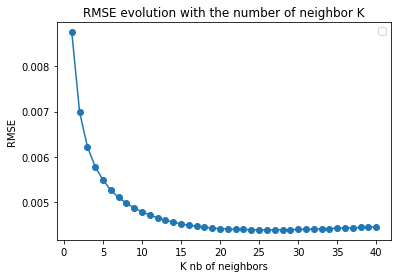

In [0]:
x_ = np.linspace(1,40,40)
plt.scatter(x_,rmse_val)
plt.plot(x_,rmse_val)
plt.xlabel('K nb of neighbors')
plt.ylabel('RMSE')
plt.title('RMSE evolution with the number of neighbor K')
plt.legend()

To be sure on the best K we perform a cross validation for each of this parameter.

In [0]:
from sklearn.model_selection import GridSearchCV
params = {'n_neighbors':[24,25,26,27,28]}

knn = neighbors.KNeighborsRegressor()

model = GridSearchCV(knn, params, cv=10)
model.fit(normed_train_features,train_labels)
model.best_params_


{'n_neighbors': 26}

In [0]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_validate
import time 
start_time = time.time()
scores = cross_validate(model.best_estimator_, normed_train_features, train_labels, cv=3, scoring=['neg_mean_squared_error','neg_mean_absolute_error'],return_train_score=True)
scores['test_neg_mean_squared_error'] = -scores['test_neg_mean_squared_error']
scores['test_neg_mean_squared_error'] = np.sqrt(scores['test_neg_mean_squared_error'])
scores['test_neg_mean_absolute_error'] = -scores['test_neg_mean_absolute_error']
print("Root Mean Squared Error: %0.f (+/- %0.f)" % (scores['test_neg_mean_squared_error'].mean(), scores['test_neg_mean_squared_error'].std() * 2))
print("MAE: %0.f (+/- %0.f)" % (scores['test_neg_mean_absolute_error'].mean(), scores['test_neg_mean_absolute_error'].std() * 2))
print('---------------%f-------------' %(start_time - time.time()))

Root Mean Squared Error: 0.00 (+/- 0.00)
MAE: 0.00 (+/- 0.00)
----------------120.657620-------------


### Random Forest

In [0]:
train_features, train_labels, test_features, test_labels = create_train_test_set(database,0.008,0.02,'price')  
normed_train_features, normed_test_features = norm(train_features), norm(test_features)

In [0]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 2, stop = 100, num = 50)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print(random_grid)

{'n_estimators': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96, 98, 100], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [0]:
from sklearn.ensemble import RandomForestRegressor
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 2, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
rf_random.fit(normed_train_features, train_labels)

In [0]:
rf_random.best_params_

{'bootstrap': False,
 'max_depth': 60,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 92}

In [0]:
#rf_random.best_params_
base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(normed_train_features, train_labels)
pes_predictions_base = base_model.predict(normed_test_features)
base_accuracy = sqrt(mean_squared_error(test_labels,pes_predictions_base))

print("Root mean squared error: {}".format(sqrt(mean_squared_error(test_labels,pes_predictions_base))))
print("Mean absolute error: {}".format(mean_absolute_error(test_labels, pes_predictions_base)))

best_random = rf_random.best_estimator_
pes_predictions_best = best_random.predict(normed_test_features)
random_accuracy = sqrt(mean_squared_error(test_labels,pes_predictions_best))

print("Root mean squared error: {} ".format(sqrt(mean_squared_error(test_labels,pes_predictions_best))))
print("Mean absolute error: {} ".format(mean_absolute_error(test_labels, pes_predictions_best)))
print('Improvement of {}%.'.format( 100 * (base_accuracy - random_accuracy) / base_accuracy))

Root mean squared error: 0.010523875513446614
Mean absolute error: 0.007753187978186148
Root mean squared error: 0.00906668795839218 
Mean absolute error: 0.006825037497665081 
Improvement of 13.84649175289606%.


In [0]:
train_features, train_labels, test_features, test_labels = create_train_test_set(database,0.08,1.,'price')  
normed_train_features, normed_test_features = norm(train_features), norm(test_features)
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [False],
    'max_depth': [60, 65, 70],
    'max_features': ['auto'],
    'min_samples_leaf': [1],
    'min_samples_split': [2],
    'n_estimators': [int(x) for x in np.linspace(start = 92, stop = 97, num = 5)]
}

rf = RandomForestRegressor()# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 2, n_jobs = -1, verbose = 2)

grid_search.fit(normed_train_features, train_labels)
print(grid_search.best_params_)

Fitting 2 folds for each of 15 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  9.8min finished


{'bootstrap': False, 'max_depth': 65, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 95}


In [0]:
train_features, train_labels, test_features, test_labels = create_train_test_set(database,0.5,1.,'price')  
normed_train_features, normed_test_features = norm(train_features), norm(test_features)

best_grid = RandomForestRegressor(bootstrap =  False,max_depth =  60, max_features = 'auto', min_samples_leaf = 1, 
                                  min_samples_split = 2, n_estimators = 100).fit(normed_train_features,train_labels)
pes_predictions_grid = best_grid.predict(normed_test_features)
grid_accuracy = sqrt(mean_squared_error(test_labels,pes_predictions_grid))

print("Root mean squared error: {}".format(sqrt(mean_squared_error(test_labels,pes_predictions_grid))))
print("Mean absolute error: {}".format(mean_absolute_error(test_labels, pes_predictions_grid)))

print('Improvement of {}'.format( 100 * (grid_accuracy - random_accuracy) / random_accuracy))

### XgBoost


In [38]:
import xgboost as xgb
boost = xgb.XGBRegressor(learning_rate=0.1,n_estimator=2000,max_depth=60)
boost.fit(normed_train_features, train_labels)
p_boost = boost.predict(normed_test_features)
print ("Score Train () --> {}".format(np.sqrt(mean_squared_error(p_boost, test_labels))))

[07:59:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Score Train () --> 0.0016398408874216674


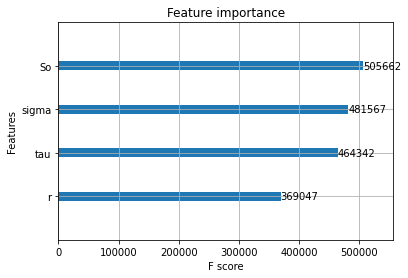

In [39]:
xgb.plot_importance(boost)

In [40]:
xgb.to_graphviz(boost, num_trees=2)

In [0]:
from sklearn.model_selection import RandomizedSearchCV

xgb_model = xgb.XGBRegressor()


parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:squarederror'],
              'learning_rate': [0.001,0.01,0.05,0.1,0.3,0.5], #so called `eta` value
              'max_depth': [i for i in range(1,50)],
              'min_child_weight': [i for i in range(1,20)],
              'silent': [1],
              'subsample': [0.8],
              'colsample_bytree': [0.7],
              'n_estimators': [i for i in range(1,2001,100)], #number of trees, change it to 1000 for better results
              }


clf = RandomizedSearchCV(xgb_model, parameters, n_jobs=-1,n_iter = 10, cv=2, verbose=2)

clf.fit(normed_train_features, train_labels)